## 0. Import libaries

In [16]:
import subprocess
import zipfile
import os
from pathlib import Path
import random
from PIL import Image
RANDOM_SEED = 42
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from tqdm.auto import tqdm
import pandas as pd

## 1. Data Process

### 1.1 Upload data

In [18]:
import subprocess
import zipfile
import os

# Download the dataset
subprocess.run(["kaggle", "datasets", "download", "-d", "tongpython/cat-and-dog"], check=True)

# Unzip the downloaded dataset
with zipfile.ZipFile("cat-and-dog.zip", "r") as zip_ref:
    zip_ref.extractall("cat_and_dog_data")

os.remove("cat-and-dog.zip")

In [19]:
# View the structure of data
def walk_through_data(dir_path):
  for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in {dirpath}")

In [20]:
from pathlib import Path

data_path = Path('cat_and_dog_data/')
train_data_path = data_path / 'training_set' / 'training_set'
test_data_path = data_path / 'test_set' / 'test_set'

print(train_data_path)
print(test_data_path)

cat_and_dog_data/training_set/training_set
cat_and_dog_data/test_set/test_set


In [21]:
print("Train structure")
walk_through_data(train_data_path)
print("Test structure")
walk_through_data(test_data_path)


Train structure
There are 2 directories and 0 images in cat_and_dog_data/training_set/training_set
There are 0 directories and 4006 images in cat_and_dog_data/training_set/training_set/dogs
There are 0 directories and 4001 images in cat_and_dog_data/training_set/training_set/cats
Test structure
There are 2 directories and 0 images in cat_and_dog_data/test_set/test_set
There are 0 directories and 1013 images in cat_and_dog_data/test_set/test_set/dogs
There are 0 directories and 1012 images in cat_and_dog_data/test_set/test_set/cats


In [22]:
## Get list of imgae train and test
image_path_list = list(data_path.glob('*/*/*/*.jpg'))
len(image_path_list)

10028

dogs


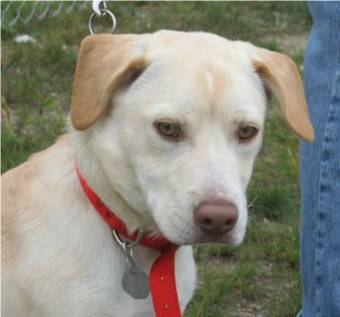

In [23]:
## Visualize some image
import random
from PIL import Image

RANDOM_SEED = 42
# random.seed(RANDOM_SEED)

# Get random image
random_image_path = random.choice(image_path_list)
random_image_path

# Get image class from path
random_image_class = random_image_path.parent.stem
print(random_image_class)

# Open image
img = Image.open(random_image_path)
img

Text(0.5, 1.0, 'Image class: dogs | Shape: (317, 340, 3)')

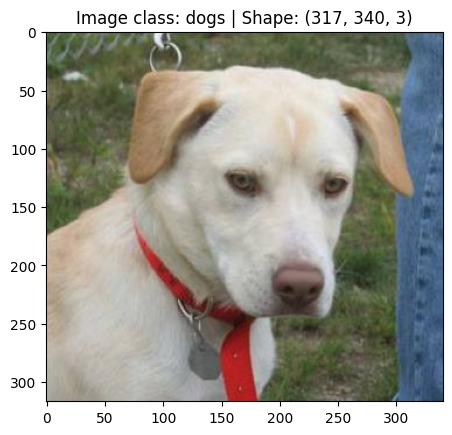

In [24]:
# Visualize using matplotlib
import matplotlib.pyplot as plt
import numpy as np

# Change image from PIL to array to get shape
img_as_array = np.asarray(img)

plt.imshow(img)
plt.title(f"Image class: {random_image_class} | Shape: {img_as_array.shape}")


### 1.2 Tranforming data

In [25]:
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# Define transform mode
data_transform = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor()
])

train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.TrivialAugmentWide(num_magnitude_bins=31), # how intense
    transforms.ToTensor() # use ToTensor() last to get everything between 0 & 1
])

# Don't need to perform augmentation on the test data
test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])


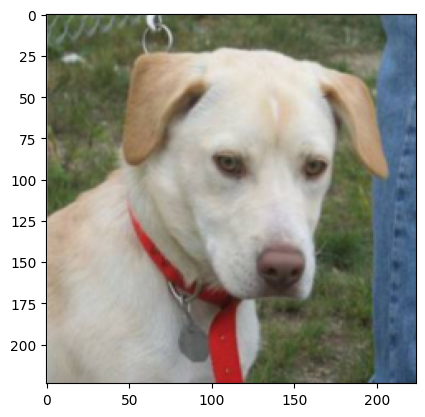

In [26]:
data_transform(img).shape
# Plt need (H, W, C) -> permute
plt.imshow(torch.permute(data_transform(img), (1, 2, 0)))

In [27]:
def plot_transformed_images(image_paths, transform, n=3, seed=RANDOM_SEED):
  # random.seed(seed)
  random_image_paths = random.sample(image_paths, k=n)
  for image_path in random_image_paths:
    plt.figure(figsize=(20, 20))
    with Image.open(image_path) as f:
      plt.subplot(1, 2, 1)
      plt.imshow(f)
      plt.title(f"Original imgae: {f.size}")
      plt.axis(False)

      plt.subplot(1, 2, 2)
      transformed_image = torch.permute(transform(f), (1, 2, 0))
      plt.imshow(transformed_image)
      plt.title(f"Original imgae: {transformed_image.shape}")
      plt.axis(False)

    plt.show()


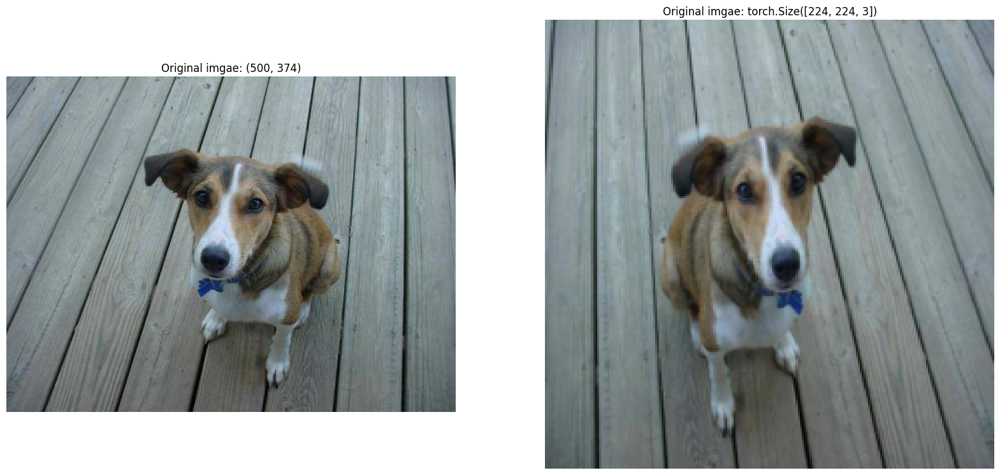

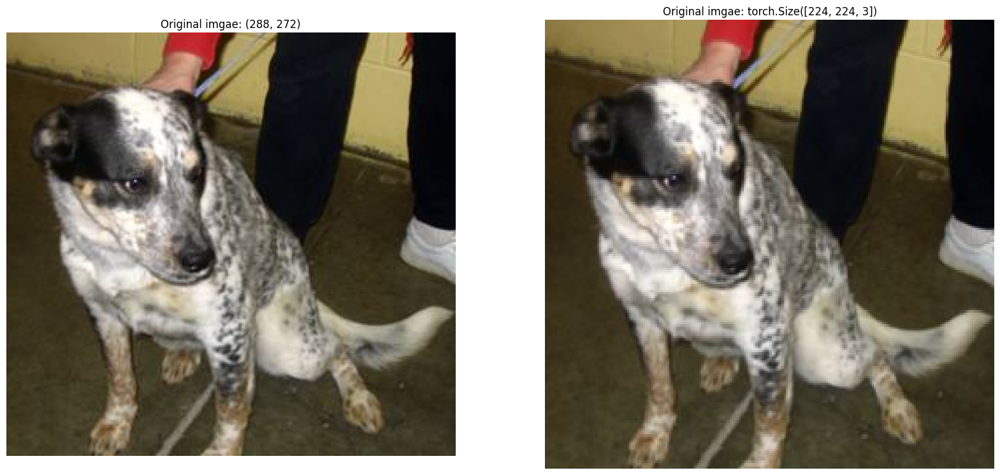

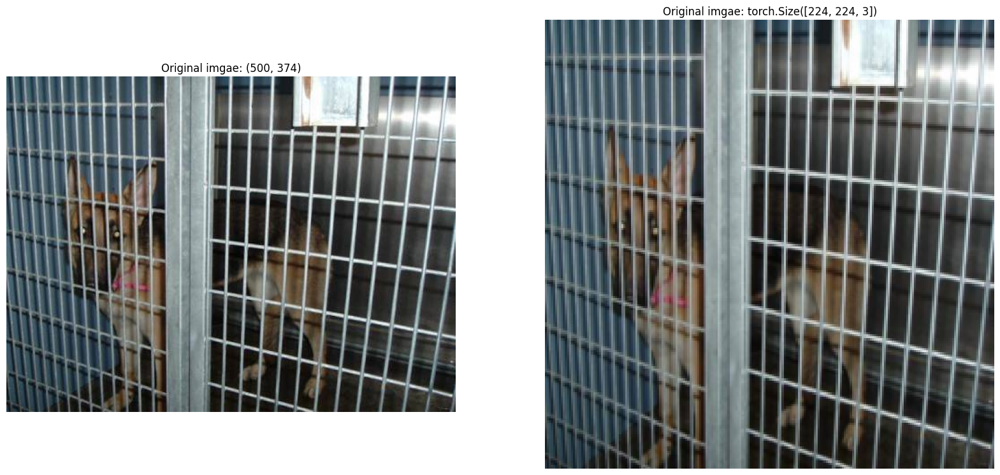

In [ ]:
plot_transformed_images(image_path_list, data_transform)

### 1.4 Loading dataset using ImageFolder

In [28]:
from torchvision import datasets

train_data = datasets.ImageFolder(root=train_data_path,
                                  transform=train_transforms,
                                  target_transform = None)

test_data = datasets.ImageFolder(root=test_data_path,
                                  transform=test_transforms,
                                  target_transform = None)


In [29]:
# Get class name
classnames = train_data.classes
classnames_idx = train_data.class_to_idx

In [30]:
len(test_data), len(train_data)

(2023, 8005)

In [31]:
## Visual some image from dataset
def visual_random_image(dataset,
                        classes,
                        n=16,
                        seed=RANDOM_SEED):
  random.seed(RANDOM_SEED)
  random_image_idx = random.sample(range(0, len(dataset)), k=n)

  ncols = 4;
  nrows = n // 4

  plt.figure(figsize=(20, 20))

  for i in range(nrows):
    for j in range(ncols):
      idx = random_image_idx[i * nrows + j]
      img, label = dataset[idx]

      plt.subplot(nrows, ncols, i * nrows + j + 1)
      plt.imshow(torch.permute(img, (1, 2, 0)))
      plt.title(classes[label])
      plt.axis(False)
  plt.show()


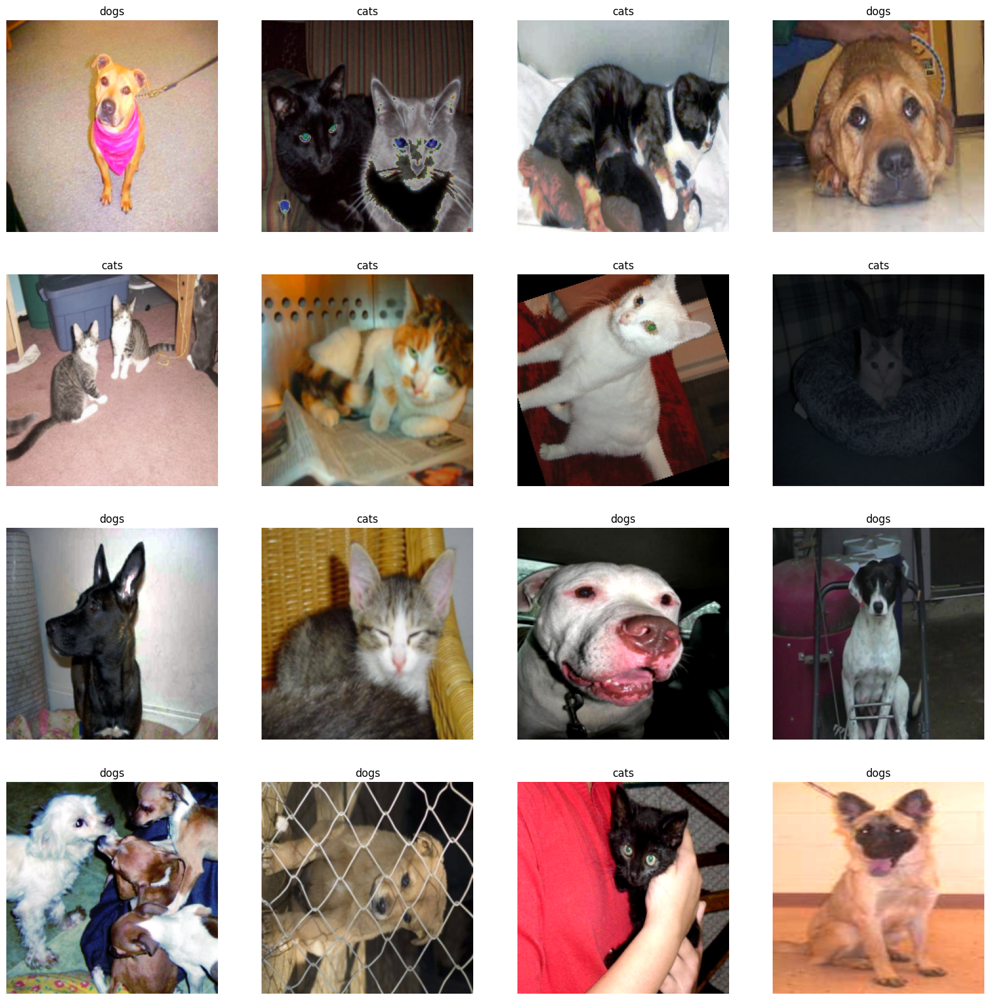

In [ ]:
visual_random_image(train_data, classnames)

### 1.5 Turn dataset into DataLoader

In [32]:
from torch.utils.data import DataLoader
BATCH_SIZE = 32
N_WORKERS = 1 #os.cpu_count()

train_dataloader = DataLoader(dataset=train_data,
                              batch_size=BATCH_SIZE,
                              shuffle=True)

test_dataloader = DataLoader(dataset=test_data,
                              batch_size=BATCH_SIZE,
                              shuffle=False)

In [ ]:
image, label = next(iter(train_dataloader))
image.shape, label.shape

(torch.Size([32, 3, 224, 224]), torch.Size([32]))

## 2. Building a model

### 2.1 Model TinyVGG without data augment

In [33]:
## Define model
import torch.nn as nn

torch.manual_seed(RANDOM_SEED)
torch.cuda.manual_seed(RANDOM_SEED)

class TinyVGG(nn.Module):
  def __init__(self, input_shape, output_shape, hidden_units = 10):
    super().__init__()
    self.conv_block_1 = nn.Sequential(
        nn.Conv2d(in_channels = input_shape,
                  out_channels = hidden_units,
                  kernel_size=(3, 3),
                  padding=1,
                  stride=1),
        nn.BatchNorm2d(hidden_units),
        nn.ReLU(),
        nn.Conv2d(in_channels = hidden_units,
                  out_channels = hidden_units * 2,
                  kernel_size=(3, 3),
                  padding=0,
                  stride=1),
        nn.BatchNorm2d(hidden_units * 2),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2)
    )
    self.conv_block_2 = nn.Sequential(
        nn.Conv2d(in_channels = hidden_units * 2,
                  out_channels = hidden_units,
                  kernel_size=(3, 3),
                  padding=1,
                  stride=1),
        nn.BatchNorm2d(hidden_units),
        nn.ReLU(),
        nn.Conv2d(in_channels = hidden_units,
                  out_channels = hidden_units,
                  kernel_size=(3, 3),
                  padding=0,
                  stride=1),
        nn.BatchNorm2d(hidden_units),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2)
    )
    self.classifier = nn.Sequential(
        nn.Flatten(),
        nn.Linear(in_features=29160, # Fix when try with sample data
                 out_features=128),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(in_features=128,
                 out_features=output_shape),
    )

  def forward(self, x):
    return self.classifier(self.conv_block_2(self.conv_block_1(x)))

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model_0 = TinyVGG(input_shape=3,
                  hidden_units=10,
                  output_shape=len(classnames)).to(device)

In [ ]:
model_0

TinyVGG(
  (conv_block_1): Sequential(
    (0): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
    (4): BatchNorm2d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_block_2): Sequential(
    (0): Conv2d(20, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1))
    (4): BatchNorm2d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1

In [ ]:
# Try forward pass to fix in_features
image_batch, label_batch = next(iter(train_dataloader))
image_batch.shape

torch.Size([32, 3, 224, 224])

In [ ]:
# Forward pass
# model_0(image_batch) # After step, get the correct in_features (32 * correct) and (10 * 2)

In [ ]:
model_0(image_batch.to("cuda")) # No error

tensor([[-0.3333,  0.0768],
        [-0.2722, -0.4156],
        [ 0.0640,  0.1329],
        [ 0.0155, -0.3497],
        [-0.1425, -0.2292],
        [ 0.0914,  0.0350],
        [ 0.0509, -0.1755],
        [ 0.2321, -0.2675],
        [ 0.0859,  0.3384],
        [ 0.4094,  0.0721],
        [ 0.2021,  0.0361],
        [-0.0243,  0.2828],
        [ 0.2262, -0.1857],
        [-0.0100,  0.6448],
        [ 0.2385,  0.1269],
        [ 0.0436, -0.0408],
        [-0.0570,  0.2736],
        [ 0.0122, -0.0220],
        [-0.1763,  0.8634],
        [ 0.6993, -0.2685],
        [-0.0876, -0.1716],
        [ 0.0439,  0.0823],
        [ 0.4680, -0.1730],
        [-0.1253,  0.1048],
        [-0.0382, -0.3653],
        [-0.1722, -0.6353],
        [ 0.0149, -0.0528],
        [-0.2197,  0.3682],
        [-0.2601, -0.2463],
        [ 0.5048,  0.3862],
        [ 0.2641, -0.0765],
        [ 0.4367,  0.1210]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
### TorchInfo to get idea about shape data going through model

# Install torchinfo
try:
  import torchinfo
except:
  !pip install torchinfo
  import torchinfo

from torchinfo import summary
summary(model_0, input_size=(32, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
TinyVGG                                  [32, 2]                   --
├─Sequential: 1-1                        [32, 20, 111, 111]        --
│    └─Conv2d: 2-1                       [32, 10, 224, 224]        280
│    └─BatchNorm2d: 2-2                  [32, 10, 224, 224]        20
│    └─ReLU: 2-3                         [32, 10, 224, 224]        --
│    └─Conv2d: 2-4                       [32, 20, 222, 222]        1,820
│    └─BatchNorm2d: 2-5                  [32, 20, 222, 222]        40
│    └─ReLU: 2-6                         [32, 20, 222, 222]        --
│    └─MaxPool2d: 2-7                    [32, 20, 111, 111]        --
├─Sequential: 1-2                        [32, 10, 54, 54]          --
│    └─Conv2d: 2-8                       [32, 10, 111, 111]        1,810
│    └─BatchNorm2d: 2-9                  [32, 10, 111, 111]        20
│    └─ReLU: 2-10                        [32, 10, 111, 111]        --
│    └─C

### 2.2 Define a train-test function

In [34]:
# Define loss, optimizer and accuracy_fn
from torch import nn

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = model_0.parameters(),
                            lr = 0.01)

def accuracy_fn(y_true, y_preds):
  correct = torch.eq(y_preds, y_true).sum().item()
  return correct / len(y_preds) * 100

NameError: name 'model_0' is not defined

In [ ]:
# Define a traning and a test function
from tqdm.auto import tqdm

def training(model: torch.nn.Module,
             dataset: torch.utils.data.DataLoader,
             loss_fn: torch.nn.Module,
             optimizer: torch.optim.Optimizer,
             accuracy_fn,
             device=device):
  model.train()

  train_loss = 0
  train_accuracy = 0

  for (X_train, y_train) in tqdm(dataset):
    X_train, y_train = X_train.to(device), y_train.to(device)

    y_logits = model(X_train)
    y_preds = torch.softmax(y_logits, dim = 1).argmax(dim=1)

    loss = loss_fn(y_logits, y_train)
    train_loss += loss.item()
    accuracy = accuracy_fn(y_train, y_preds)
    train_accuracy += accuracy

    optimizer.zero_grad()

    loss.backward()

    optimizer.step()

  train_loss /= len(dataset)
  train_accuracy /= len(dataset)

  print(f"Train loss: {train_loss:.5f}   | Accuracy: {train_accuracy:.3f}")
  return train_loss, train_accuracy

def testing(model: torch.nn.Module,
             dataset: torch.utils.data.DataLoader,
             loss_fn: torch.nn.Module,
             optimizer: torch.optim.Optimizer,
             accuracy_fn,
             device=device):
  model.eval()
  test_loss = 0
  test_accuracy = 0
  with torch.inference_mode():
    for (X_test, y_test) in tqdm(dataset):
      X_test, y_test = X_test.to(device), y_test.to(device)

      y_logits = model(X_test)
      y_preds = torch.softmax(y_logits, dim=1).argmax(dim=1)

      loss = loss_fn(y_logits, y_test)
      test_loss += loss.item()
      accuracy = accuracy_fn(y_test, y_preds)
      test_accuracy += accuracy
    test_loss /= len(dataset)
    test_accuracy /= len(dataset)
  print(f"Test loss: {test_loss:.5f}   | Accuracy: {test_accuracy:.3f}")
  return test_loss, test_accuracy

In [ ]:
## Define a train model function
def trainModel(model: torch.nn.Module,
               train_data: torch.utils.data.DataLoader,
               test_data: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               accuracy_fn,
               epochs: int,
               device=device):
  results = {
      "train_loss": [],
      "train_accuracy": [],
      "test_loss": [],
      "test_accuracy": [],
      "epoch": []
  }
  best = 1e9
  for epoch in tqdm(range(epochs)):
    print(f"Epoch: {epoch}\n------------")
    train_loss, train_accuracy = training(model=model,
                                          dataset=train_data,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          accuracy_fn=accuracy_fn)
    test_loss, test_accuracy = testing(model=model,
                                          dataset=test_data,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          accuracy_fn=accuracy_fn)
    results["train_loss"].append(train_loss)
    results["test_loss"].append(test_loss)
    results["train_accuracy"].append(train_accuracy)
    results["test_accuracy"].append(test_accuracy)
    results["epoch"].append(epoch)

    # Save the best model
    if test_loss < best:
      best = test_loss
      torch.save(model.state_dict(), 'best.pth')
      print("Saving best model ...")

  return results

In [ ]:
## Start train model
results_train_model_0 = trainModel(model=model_0,
                                   train_data=train_dataloader,
                                   test_data=test_dataloader,
                                   loss_fn=loss_fn,
                                   optimizer=optimizer,
                                   accuracy_fn=accuracy_fn,
                                   epochs=5)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 0
------------


  0%|          | 0/251 [00:00<?, ?it/s]

Train loss: 0.69350   | Accuracy: 49.935


  0%|          | 0/64 [00:00<?, ?it/s]

Test loss: 0.69383   | Accuracy: 49.365
Epoch: 1
------------


  0%|          | 0/251 [00:00<?, ?it/s]

Train loss: 0.69338   | Accuracy: 50.095


  0%|          | 0/64 [00:00<?, ?it/s]

Test loss: 0.69383   | Accuracy: 49.365
Epoch: 2
------------


  0%|          | 0/251 [00:00<?, ?it/s]

Train loss: 0.69347   | Accuracy: 50.040


  0%|          | 0/64 [00:00<?, ?it/s]

Test loss: 0.69383   | Accuracy: 49.365
Epoch: 3
------------


  0%|          | 0/251 [00:00<?, ?it/s]

Train loss: 0.69343   | Accuracy: 49.978


  0%|          | 0/64 [00:00<?, ?it/s]

Test loss: 0.69383   | Accuracy: 49.365
Epoch: 4
------------


  0%|          | 0/251 [00:00<?, ?it/s]

Train loss: 0.69353   | Accuracy: 49.880


  0%|          | 0/64 [00:00<?, ?it/s]

Test loss: 0.69383   | Accuracy: 49.414


In [ ]:
def plot_train_model_progess(results):
  train_loss = results["train_loss"]
  test_loss = results["test_loss"]
  train_acc = results["train_accuracy"]
  test_acc = results["test_accuracy"]
  epoch = results["epoch"]

  plt.figure(figsize=(20, 10))

  plt.subplot(1, 2, 1)
  plt.plot(epoch, train_loss, label="Train loss")
  plt.plot(epoch, test_loss, label="Test loss")
  plt.title("Loss progress")
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.legend()

  plt.subplot(1, 2, 2)
  plt.plot(epoch, train_acc, label="Train acc")
  plt.plot(epoch, test_acc, label="Test acc")
  plt.title("Accuracy progress")
  plt.xlabel("Epochs")
  plt.ylabel("Accuracy")
  plt.legend()

  plt.show()

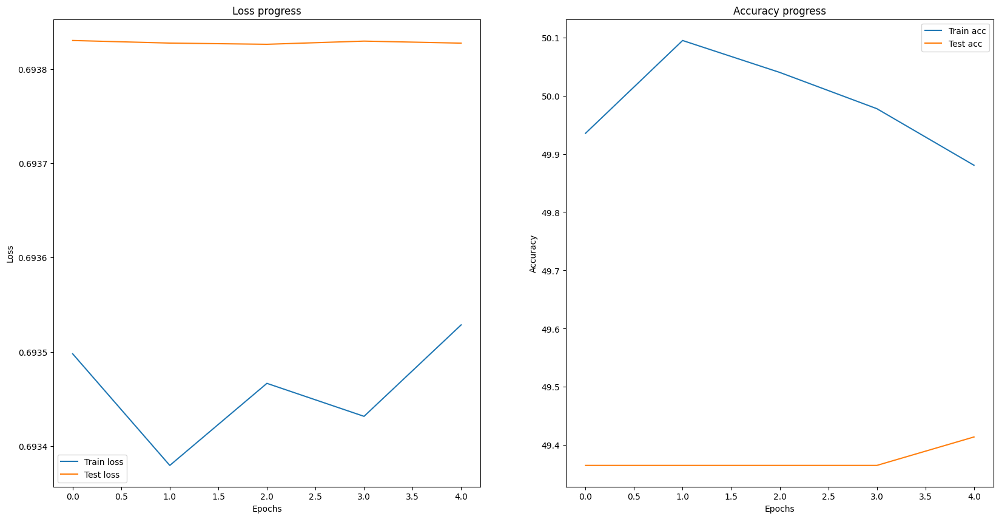

In [ ]:
plot_train_model_progess(results_train_model_0)

### 2.3 Pre-trained model

In [5]:
from torchvision import models
from torch import nn
class EfficientNetB0(nn.Module):
  def __init__(self, input_shape, output_shape, hidden_units):
    super().__init__()
    self.input_shape = input_shape
    self.output_shape = output_shape
    self.model = models.efficientnet_b0(pretrained=True)
    self.model.classifier = nn.Sequential(
        nn.Linear(in_features= self.model.classifier[1].in_features,
                 out_features=128),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(in_features=128,
                 out_features=output_shape),
    )
  def forward(self, x):
    return self.model(x)

In [ ]:
model_1 = EfficientNetB0(3, len(classnames), 10).to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 122MB/s] 


In [ ]:
summary(model_1, input_size=(32, 3, 224, 224))

Layer (type:depth-idx)                                       Output Shape              Param #
EfficientNetB0                                               [32, 2]                   --
├─EfficientNet: 1-1                                          [32, 2]                   --
│    └─Sequential: 2-1                                       [32, 1280, 7, 7]          --
│    │    └─Conv2dNormActivation: 3-1                        [32, 32, 112, 112]        928
│    │    └─Sequential: 3-2                                  [32, 16, 112, 112]        1,448
│    │    └─Sequential: 3-3                                  [32, 24, 56, 56]          16,714
│    │    └─Sequential: 3-4                                  [32, 40, 28, 28]          46,640
│    │    └─Sequential: 3-5                                  [32, 80, 14, 14]          242,930
│    │    └─Sequential: 3-6                                  [32, 112, 14, 14]         543,148
│    │    └─Sequential: 3-7                                  [32, 192, 7,

In [ ]:
for param in model_1.model.parameters():
  param.requires_grad = False
for param in model_1.model.classifier.parameters():
  param.requires_grad = True

# Define loss, optimizer and accuracy_fn
from torch import nn

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = model_1.parameters(),
                            lr = 0.01)

def accuracy_fn(y_true, y_preds):
  correct = torch.eq(y_preds, y_true).sum().item()
  return correct / len(y_preds) * 100

In [ ]:
## Start train model
results_train_model_1 = trainModel(model=model_1,
                                   train_data=train_dataloader,
                                   test_data=test_dataloader,
                                   loss_fn=loss_fn,
                                   optimizer=optimizer,
                                   accuracy_fn=accuracy_fn,
                                   epochs=5)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 0
------------


  0%|          | 0/251 [00:00<?, ?it/s]

Train loss: 0.21718   | Accuracy: 91.703


  0%|          | 0/64 [00:00<?, ?it/s]

Test loss: 0.08875   | Accuracy: 96.973
Saving best model ...
Epoch: 1
------------


  0%|          | 0/251 [00:00<?, ?it/s]

Train loss: 0.21067   | Accuracy: 91.808


  0%|          | 0/64 [00:00<?, ?it/s]

Test loss: 0.09667   | Accuracy: 96.994
Epoch: 2
------------


  0%|          | 0/251 [00:00<?, ?it/s]

Train loss: 0.21218   | Accuracy: 91.828


  0%|          | 0/64 [00:00<?, ?it/s]

Test loss: 0.09472   | Accuracy: 97.070
Epoch: 3
------------


  0%|          | 0/251 [00:00<?, ?it/s]

Train loss: 0.23532   | Accuracy: 91.566


  0%|          | 0/64 [00:00<?, ?it/s]

Test loss: 0.11926   | Accuracy: 96.777
Epoch: 4
------------


  0%|          | 0/251 [00:00<?, ?it/s]

Train loss: 0.25634   | Accuracy: 91.686


  0%|          | 0/64 [00:00<?, ?it/s]

Test loss: 0.12302   | Accuracy: 96.847


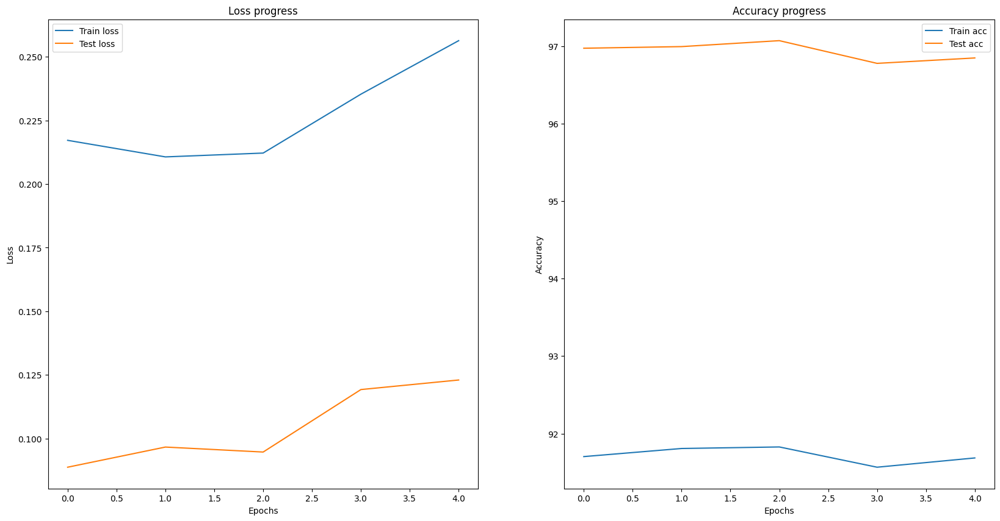

In [ ]:
plot_train_model_progess(results_train_model_1)

## 3. Eval model

In [ ]:
def evalModel(model: torch.nn.Module,
              dataset: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              optimizer: torch.optim.Optimizer,
              accuarcy_fn,
              device=device):
  model.eval()
  loss_val = 0
  acc_val = 0
  with torch.inference_mode():
    for (X, y) in tqdm(dataset):
      X, y = X.to(device), y.to(device)

      y_logits = model(X)
      y_preds = torch.softmax(y_logits, dim=1).argmax(dim=1)

      loss = loss_fn(y_logits, y)
      loss_val += loss
      acc = accuracy_fn(y, y_preds)
      acc_val += acc

    loss_val /= len(dataset)
    acc_val /= len(dataset)

  return {
      "Name": model.__class__.__name__,
      "Loss": loss_val.item(),
      "Accuracy": acc_val
  }



In [ ]:
eval_model_0 = evalModel(model_0, test_dataloader, loss_fn, optimizer, accuracy_fn)
eval_model_0

  0%|          | 0/64 [00:00<?, ?it/s]

{'Name': 'TinyVGG', 'Loss': 0.6938270926475525, 'Accuracy': 49.4140625}

In [ ]:
eval_model_1 = evalModel(model_1, test_dataloader, loss_fn, optimizer, accuracy_fn)
eval_model_1

  0%|          | 0/64 [00:00<?, ?it/s]

{'Name': 'EfficientNetB0',
 'Loss': 0.1230195164680481,
 'Accuracy': 96.84709821428571}

### 3.1 Make some predict with model

In [ ]:
# Get random image path
random_path = random.choice(image_path_list)
random_path, random_path.parent.stem

# Tranform data to coorect form of model
img = Image.open(random_path)
transformed_img = data_transform(img)
transformed_img.shape

torch.Size([3, 224, 224])

In [ ]:
# Get random image


In [ ]:
img.shape

torch.Size([3, 224, 224])

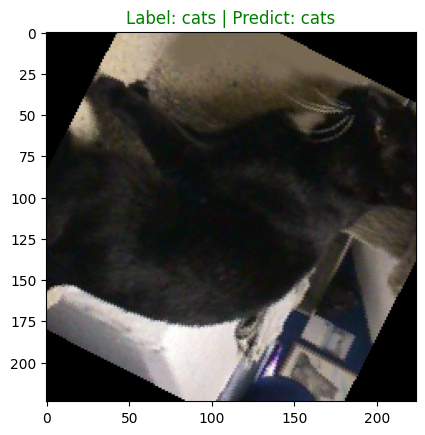

In [ ]:
# Get predict from model
img, label = random.choice(train_data)
with torch.inference_mode():

  y_logits = model_1(img.unsqueeze(dim=0).to(device))
  y_preds = torch.softmax(y_logits, dim=1).argmax(dim=1).item()

  plt.imshow(torch.permute(img, (1, 2, 0)))
  if y_preds == label:
    plt.title(f"Label: {classnames[label]} | Predict: {classnames[y_preds]}", c='g')
  else:
    plt.title(f"Label: {classnames[label]} | Predict: {classnames[y_preds]}", c='r')

In [13]:
def single_predict(model: torch.nn.Module, path: str):
  img = Image.open(path)

  with torch.inference_mode():
    transformed_img = data_transform(img).to(device)

    y_logit = model(transformed_img.unsqueeze(dim=0))
    y_pred = torch.softmax(y_logit, dim=1).argmax(dim=1).item()

    plt.imshow(img)
    plt.title(f"This is a {classnames[y_pred]}")
    plt.axis(False)
    plt.show()

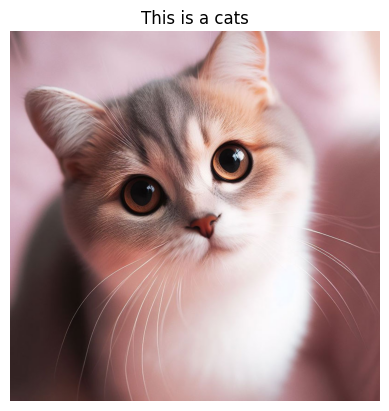

In [179]:
single_predict(model_1, '/content/ngo-nghinh-anh-meo-cute-nupet-19.jpg')

In [ ]:
## Define a function mutli predict
def multi_predict(model: torch.nn.Module,
                  data,
                  n = 16, rand = RANDOM_SEED):
  random_idx = random.sample(range(len(data)), k=n)
  ncols = 4
  nrows = n // ncols
  correct = 0

  plt.figure(figsize=(20, 20))

  for i in range(nrows):
    for j in range(ncols):
      img, label = data[random_idx[i * nrows + j]]
      plt.subplot(nrows, ncols, i * nrows + j + 1)

      img = img.to(device)
      with torch.inference_mode():
        y_logit = model(img.unsqueeze(dim=0))
        y_pred = torch.softmax(y_logit, dim=1).argmax(dim=1).item()

      plt.imshow(torch.permute(img, (1, 2, 0)).cpu().numpy())
      if y_pred == label:
        correct += 1
        plt.title(f"Label: {classnames[label]} | Predict: {classnames[y_pred]}", c='g')
      else:
        plt.title(f"Label: {classnames[label]} | Predict: {classnames[y_pred]}", c='r')
      plt.axis(False)
  plt.suptitle(f"Accuracy: {correct / n * 100}")


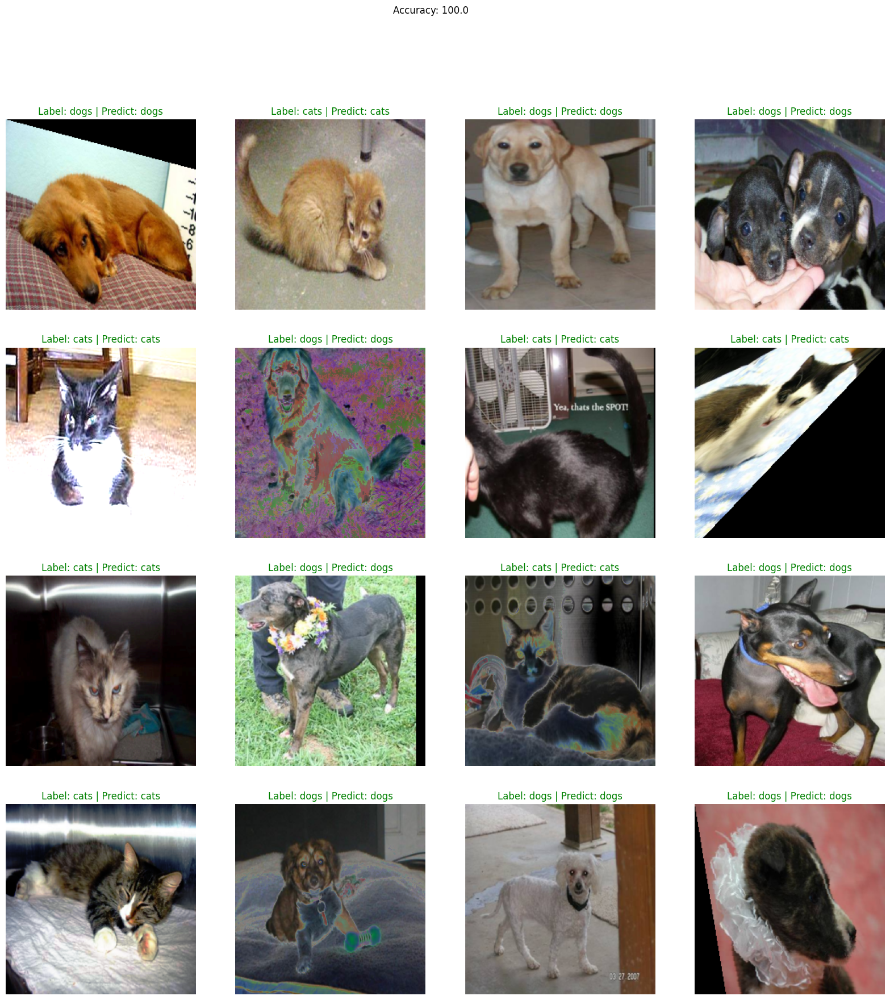

In [ ]:
multi_predict(model_1, train_data)

## 4. Experiments

In [169]:
# Visual metrics
import pandas as pd

compare_results = pd.DataFrame([eval_model_0, eval_model_1])
compare_results

,Name,Loss,Accuracy
0,TinyVGG,0.693827,49.414062
1,EfficientNetB0,0.123020,96.847098


Text(0, 0.5, 'Model')

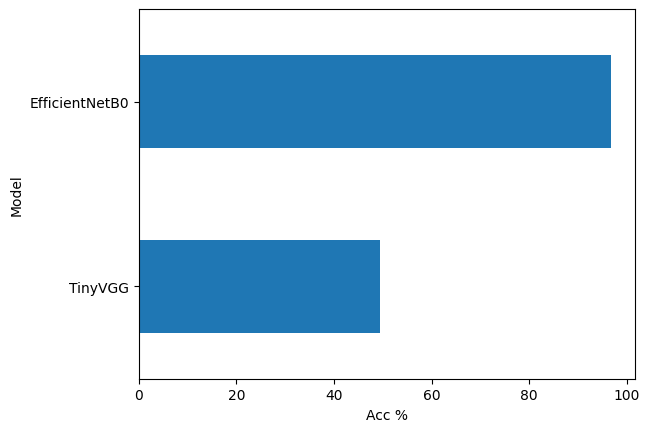

In [171]:
compare_results.set_index("Name")["Accuracy"].plot(kind='barh')
plt.xlabel("Acc %")
plt.ylabel("Model")

In [199]:
# 1. Make predictions with trained model
y_preds = []
model_1.eval()
with torch.inference_mode():
  for X, y in tqdm(test_dataloader, desc="Making predictions...."):
    X, y = X.to(device), y.to(device)

    y_logits = model_1(X)

    y_pred = torch.softmax(y_logits, dim = 1).argmax(dim=1)

    y_preds.append(y_pred)

# Concatenate list of predictions into a tensor
y_pred_tensor = torch.cat(y_preds)
y_pred_tensor

Making predictions....:   0%|          | 0/64 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 1, 1], device='cuda:0')

In [181]:
!pip install torchmetrics # install if not have
import torchmetrics

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [196]:
torch.tensor(test_data.targets)

tensor([0, 0, 0,  ..., 1, 1, 1])

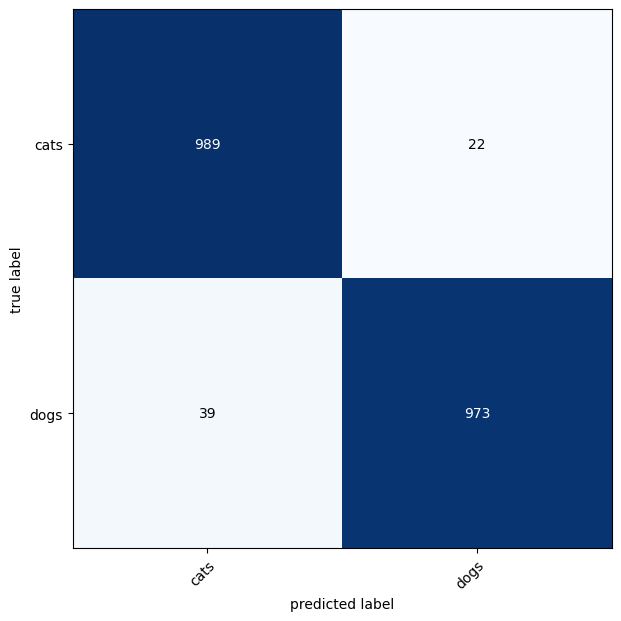

In [205]:
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

confmat = ConfusionMatrix(num_classes=len(classnames), task='multiclass').to(device)
confmat_tensor = confmat(preds=y_pred_tensor.to(device),
                         target=torch.tensor(test_data.targets).to(device))

fix, ax = plot_confusion_matrix(
    conf_mat = confmat_tensor.cpu().numpy(),
    class_names = classnames,
    figsize = (10, 7),
)

## 5. Saving and loading model

### 5.1 Saving model

In [ ]:
# torch.save(model_1.state_dict(), 'best.pth')

### 5.2 Loading model

In [217]:
model_2 = EfficientNetB0(3, 2, 10).to(device)
eval_model_2 = evalModel(model_2, test_dataloader, loss_fn, optimizer, accuracy_fn)
eval_model_2

  0%|          | 0/64 [00:00<?, ?it/s]

{'Name': 'EfficientNetB0',
 'Loss': 0.6843644380569458,
 'Accuracy': 59.312220982142854}

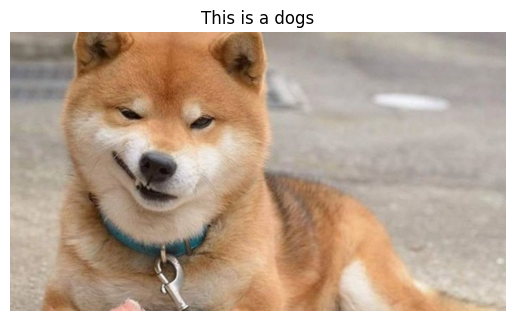

In [218]:
single_predict(model_1, '/content/anh-con-cho-28.jpg')

In [214]:
model_2.load_state_dict(torch.load('best.pth'))

<All keys matched successfully>

In [215]:
eval_model_2 = evalModel(model_2, test_dataloader, loss_fn, optimizer, accuracy_fn)
eval_model_2

  0%|          | 0/64 [00:00<?, ?it/s]

{'Name': 'EfficientNetB0', 'Loss': 0.0887547954916954, 'Accuracy': 96.97265625}

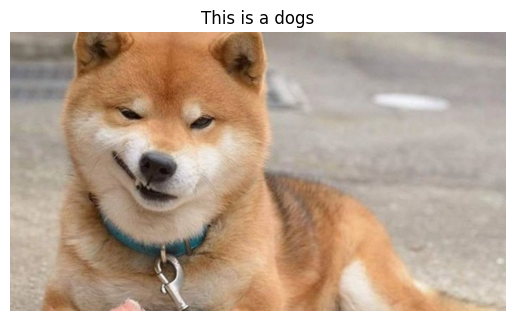

In [216]:
single_predict(model_1, '/content/anh-con-cho-28.jpg')

## 6. Deploy model into app

In [47]:
# Import/install Gradio
try:
    import gradio as gr
except:
    !pip -q install gradio
    import gradio as gr

print(f"Gradio version: {gr.__version__}")

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 45.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.2/318.2 kB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.1/141.1 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 47.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.2/92.2 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━

In [8]:
device = "cuda" if torch.cuda.is_available() else "cpu"
# Get model to predict
effnetb0 = EfficientNetB0(input_shape=3,
                          output_shape=2,
                          hidden_units=10).to(device)

In [12]:
effnetb0.load_state_dict(torch.load('best.pth', map_location=torch.device(device)))

<All keys matched successfully>

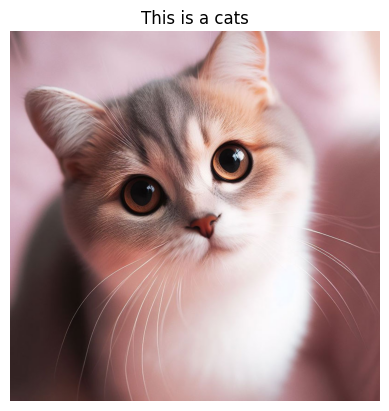

In [35]:
single_predict(effnetb0, '/content/ngo-nghinh-anh-meo-cute-nupet-19.jpg')

In [37]:
effnetb0_transforms = transforms.Compose([
    transforms.Resize(size=(224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor()
])

In [44]:
from typing import Tuple, Dict
from timeit import default_timer as timer
def predict(img) -> Tuple[Dict, float]:
    """Transforms and performs a prediction on img and returns prediction and time taken.
    """

    # Start the timer
    start_time = timer()

    # Transform the target image and add a batch dimension
    img = effnetb0_transforms(img).unsqueeze(0)

    # Put model into evaluation mode and turn on inference mode
    effnetb0.eval()
    with torch.inference_mode():
        # Pass the transformed image through the model and turn the prediction logits into prediction probabilities
        pred_probs = torch.softmax(effnetb0(img), dim=1)

    # Create a prediction label and prediction probability dictionary for each prediction class (this is the required format for Gradio's output parameter)
    pred_labels_and_probs = {classnames[i]: float(pred_probs[0][i]) for i in range(len(classnames))}

    # Calculate the prediction time
    pred_time = round(timer() - start_time, 5)

    # Return the prediction dictionary and prediction time
    return pred_labels_and_probs, pred_time

In [45]:
import random
from PIL import Image

img = Image.open('/content/anh-con-cho-28.jpg')
print(f"[INFO] Predicting on image at path: {random_image_path}\n")

# Predict on the target image and print out the outputs
pred_dict, pred_time = predict(img=img)
print(f"Prediction label and probability dictionary: \n{pred_dict}")
print(f"Prediction time: {pred_time} seconds")

[INFO] Predicting on image at path: cat_and_dog_data/test_set/test_set/dogs/dog.4225.jpg

Prediction label and probability dictionary: 
{'cats': 3.887583943651407e-08, 'dogs': 1.0}
Prediction time: 0.06886 seconds


In [51]:
import gradio as gr

# Create title, description and article strings
title = "Dog and Cat Classification Mini"
description = "An EfficientNetB2 feature extractor computer vision model to classify images of dog or cat"
article = "Created at 30/7/2024.\n By BlackRose"

# Create the Gradio demo
demo = gr.Interface(fn=predict, # mapping function from input to output
                    inputs=gr.Image(type="pil"), # what are the inputs?
                    outputs=[gr.Label(num_top_classes=2, label="Predictions"), # what are the outputs?
                             gr.Number(label="Prediction time (s)")], # our fn has two outputs, therefore we have two outputs
                    title=title,
                    description=description,
                    article=article)

# Launch the demo!
demo.launch(debug=False, # print errors locally?
            share=True) # generate a publically shareable URL?

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://cbec52161bf49da139.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
